Read the experiment results/logs

In [1]:
import numpy as np
import pandas as pd

from pathlib import Path
from datetime import datetime
import json
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib
matplotlib.use('Agg')       # Use non-interactive backend for matplotlib to save memory

from utils import print_log

Experiment folder

In [2]:
expt_datetime = datetime(2025, 7, 23, 18, 33, 9)
result_phrase = "validation"  # or "test" or "validate"

expt_folder = Path("experiments") / expt_datetime.strftime("%Y%m%d_%H%M%S") / ("logs_" + result_phrase)

if not expt_folder.exists():
    print_log(f"Experiment folder {expt_folder} does not exist. Please check the path.")

Before hand, we read the env config json and display information

In [3]:
env_config_path = expt_folder.parent / "logs_train" / "env_config.json"
if not env_config_path.exists():
    print_log(f"Environment config file {env_config_path} does not exist. Please check the path.")

# Load environment configuration
with open(env_config_path, 'r') as f:
    env_config = json.load(f)

# Display environment configuration
print_log("Environment Configuration:")
for key, value in env_config.items():
    print_log(f"{key}: {value}")

[2025-07-25 00:47:06:311] Environment config file experiments/20250723_183309/logs_train/env_config.json does not exist. Please check the path.


FileNotFoundError: [Errno 2] No such file or directory: 'experiments/20250723_183309/logs_train/env_config.json'

In [4]:
# max_battery_capacity = env_config.get("battery").get("capacity", 8)
max_battery_capacity = 8

We look for `validation_<phrase>_episode_<episode_number>.json` file under the expt_folder to identify after N episodes does a validation occured.

Then we store lists of episode_number for each phrase. The phrases are "quick" and "critical".

In [5]:
phrases = ["quick", "critical"]
episode_numbers = {phrase: [] for phrase in phrases}

# Search for validation files in the experiment folder
for phrase in phrases:
    for file in expt_folder.glob(f"validation_{phrase}_episode_*.json"):
        episode_number = int(file.stem.split('_')[-1])
        episode_numbers[phrase].append(episode_number)

# Sort episode numbers for each phrase
for phrase in phrases:
    episode_numbers[phrase].sort()

print_log("Episode Numbers for Each Phrase:")
for phrase, numbers in episode_numbers.items():
    print_log(f"{phrase}: {numbers}")

[2025-07-25 00:47:10:563] Episode Numbers for Each Phrase:
[2025-07-25 00:47:10:563] quick: [5, 10, 15, 20, 25, 30, 35, 40, 45, 55, 60, 65, 70, 75, 80, 85, 90, 95, 105, 110, 115, 120, 125, 130, 135, 140, 145, 155, 160, 165, 170, 175, 180, 185, 190, 195, 205, 210, 215, 220, 225, 230, 235, 240, 245, 255, 260, 265, 270, 275, 280, 285, 290, 295, 305, 310, 315, 320, 325, 330, 335, 340, 345, 355, 360, 365, 370, 375, 380, 385, 390, 395, 405, 410, 415, 420, 425, 430, 435, 440, 445, 455, 460, 465, 470, 475, 480, 485, 490, 495, 505, 510, 515, 520, 525, 530, 535, 540, 545, 555, 560, 565, 570, 575, 580, 585, 590, 595]
[2025-07-25 00:47:10:563] critical: [50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600]


---

We also load the information of each episode into a list of dataframes

In [6]:
import glob

episode_jsons = {phrase: [] for phrase in phrases}
episode_info_dfs = {phrase: [] for phrase in phrases}

for phrase, episode_numbers_list in episode_numbers.items():
    if not episode_numbers_list:
        print_log(f"No episodes found for phrase '{phrase}'.")
        continue

    for episode_number in episode_numbers_list:
        episode_file = expt_folder / f"validation_{phrase}_episode_{episode_number:0>4}.json"
        if episode_file.exists():
            with open(episode_file, 'r') as f:
                episode_info = json.load(f)
                episode_jsons[phrase].append(episode_info)

            print_log(f"Loaded episode {episode_number} for phrase '{phrase}' from {episode_file}.")
        else:
            print_log(f"Episode file {episode_file} does not exist.")

for phrase, episode_numbers_list in episode_numbers.items():
    if not episode_numbers_list:
        continue

    for i, episode_valid_number in enumerate(episode_numbers_list):
        episode_info_files = sorted(glob.glob(str(expt_folder / f"episode_{episode_valid_number:0>4}" / "episode_info" / "*.json")))

        df_list = []

        for j, episode_info_file in enumerate(episode_info_files):
            if not Path(episode_info_file).exists():
                print_log(f"Episode info file {episode_info_file} does not exist.")
                continue

            with open(episode_info_file, 'r') as f:
                episode_info = json.load(f)
                df = pd.DataFrame(episode_info)

                # episode number can be acquired from the episode_info json file above
                episode_num = episode_jsons[phrase][i]['episode_indices'][j]

                # add a column for the episode valid number
                df['episode_valid'] = episode_valid_number

                # convert the datetime strings to datetime objects using python isoformat
                df['datetime'] = pd.to_datetime(df['datetime'], format='ISO8601')

                # temporary fix
                # we shift "grid_load (W)", "action (kW)", "battery_action (kW)", "reward", "f_signal", "g_signal" columns to the a timestep forward, then drop the last row for each episode
                df['grid_load (W)'] = df['grid_load (W)'].shift(-1)
                df['action (kW)'] = df['action (kW)'].shift(-1)
                df['battery_action (kW)'] = df['battery_action (kW)'].shift(-1)
                df['reward'] = df['reward'].shift(-1)
                df['f_signal'] = df['f_signal'].shift(-1)
                df['g_signal'] = df['g_signal'].shift(-1)
                # remove the last row for each episode
                df = df[:-1]

                df_list.append(df)

                print_log(f"Loaded episode info for {phrase} episode {episode_number} from {episode_info_file}.")

        episode_info_dfs[phrase].append(df_list)


[2025-07-25 00:47:26:632] Loaded episode 5 for phrase 'quick' from experiments/20250723_183309/logs_validation/validation_quick_episode_0005.json.
[2025-07-25 00:47:26:633] Loaded episode 10 for phrase 'quick' from experiments/20250723_183309/logs_validation/validation_quick_episode_0010.json.
[2025-07-25 00:47:26:633] Loaded episode 15 for phrase 'quick' from experiments/20250723_183309/logs_validation/validation_quick_episode_0015.json.
[2025-07-25 00:47:26:633] Loaded episode 20 for phrase 'quick' from experiments/20250723_183309/logs_validation/validation_quick_episode_0020.json.
[2025-07-25 00:47:26:633] Loaded episode 25 for phrase 'quick' from experiments/20250723_183309/logs_validation/validation_quick_episode_0025.json.
[2025-07-25 00:47:26:633] Loaded episode 30 for phrase 'quick' from experiments/20250723_183309/logs_validation/validation_quick_episode_0030.json.
[2025-07-25 00:47:26:633] Loaded episode 35 for phrase 'quick' from experiments/20250723_183309/logs_validation/v

In [7]:
episode_info_dfs['quick'][0][3].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1439 entries, 0 to 1438
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   episode_index               1439 non-null   int64         
 1   current_step                1439 non-null   int64         
 2   datetime                    1439 non-null   datetime64[ns]
 3   battery_soc (%)             1439 non-null   float64       
 4   battery_soc (kWh)           1439 non-null   float64       
 5   user_load (W)               1439 non-null   float64       
 6   grid_load (W)               1439 non-null   float64       
 7   action (kW)                 1439 non-null   float64       
 8   battery_action (kW)         1439 non-null   float64       
 9   reward                      1439 non-null   float64       
 10  f_signal                    1439 non-null   float64       
 11  g_signal                    1439 non-null   float64     

In [7]:
# lets compute the average and std variation of sum of rewards for each validation episode
rewards_stats = {phrase: [] for phrase in phrases}

for i, (phrase, episode_info_df_list) in enumerate(episode_info_dfs.items()):

    for df_list in episode_info_df_list:
        per_valid_episode = []
        
        for df in df_list:

            _dict = {}

            _reward_sum = np.sum(df['reward'])
            _f_signal_sum = np.sum(df['f_signal'])
            _g_signal_sum = np.sum(df['g_signal'])

            _dict['episode_valid'] = df['episode_valid'].iloc[0]
            _dict['episode_index'] = df['episode_index'].iloc[0]
            _dict['reward_sum'] = _reward_sum
            _dict['f_signal_sum'] = _f_signal_sum
            _dict['g_signal_sum'] = _g_signal_sum

            per_valid_episode.append(_dict)

        print_log(f"Computed rewards stats for {phrase} validation episodes.")
        rewards_stats[phrase].append(pd.DataFrame(per_valid_episode))

for phrase, stats in rewards_stats.items():
    rewards_stats[phrase] = pd.concat(stats, ignore_index=True)

rewards_df = pd.concat([rewards_stats[phrase] for phrase in phrases], ignore_index=True)
rewards_df = rewards_df.groupby('episode_valid').aggregate({
    'reward_sum': ['mean', 'std'],
    'f_signal_sum': ['mean', 'std'],
    'g_signal_sum': ['mean', 'std']
})
rewards_df.columns = ['_'.join(col).strip() for col in rewards_df.columns.values]

[2025-07-25 00:17:04:904] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:905] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:907] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:909] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:910] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:912] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:913] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:914] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:915] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:917] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:918] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:920] Computed rewards stats for quick validation episodes.
[2025-07-25 00:17:04:922] Computed rewar

In [8]:
rewards_df

,reward_sum_mean,reward_sum_std,f_signal_sum_mean,f_signal_sum_std,g_signal_sum_mean,g_signal_sum_std
episode_valid,,,,,,
5,46.501182,11.231696,-93.215549,22.481701,0.213184,0.039881
10,53.210393,21.102399,-106.640082,42.263239,0.219297,0.070540
15,51.383565,27.720991,-103.525980,55.457052,0.758850,0.299602
20,57.906204,25.746734,-116.563225,51.581188,0.750816,0.220855
25,45.126180,11.504905,-91.364101,23.168457,1.111740,0.195728
...,...,...,...,...,...,...
580,106.919673,23.168013,-215.665114,46.375063,1.825769,0.296738
585,112.218832,23.855057,-226.494137,47.565880,2.056472,0.485950
590,100.133423,20.426787,-202.106873,40.841326,1.840028,0.256888


In [8]:

episode_info_folder = expt_folder / f"episode_" / "episode_info"
if episode_info_folder.exists():
    episode_info_files = sorted(list(episode_info_folder.glob("*.json")))
    episode_info_dfs = []

    for file in episode_info_files:
        with open(file, "r") as f:
            episode_info = json.load(f)
            df = pd.DataFrame(episode_info)
            # add a column for the episode number
            df['episode'] = int(file.stem.split('_')[1])  # Assuming the file name is like "episode_0_info.json", "episode_1_info.json", etc.
            # convert the datetime strings to datetime objects using python isoformat
            df['datetime'] = pd.to_datetime(df['datetime'], format='ISO8601')

            # temporary fix
            # we shift "grid_load (W)", "action (kW)", "battery_action (kW)", "reward", "f_signal", "g_signal" columns to the a timestep forward, then drop the last row for each episode
            df['grid_load (W)'] = df['grid_load (W)'].shift(-1)
            df['action (kW)'] = df['action (kW)'].shift(-1)
            df['battery_action (kW)'] = df['battery_action (kW)'].shift(-1)
            df['reward'] = df['reward'].shift(-1)
            df['f_signal'] = df['f_signal'].shift(-1)
            df['g_signal'] = df['g_signal'].shift(-1)
            # remove the last row for each episode
            df = df[:-1]

            episode_info_dfs.append(df)

            print_log(f"Loaded episode info from {file.name}")

    # Concatenate all DataFrames into one
    episode_info_df = pd.concat(episode_info_dfs, ignore_index=True)
    

In [ ]:
episode_info_df.head(20)

In [ ]:
episode_info_df.info()

In [ ]:
# create episodes_rewards_df from episode_info_df
# compute the total reward, mean, and std for each episode
episodes_rewards_df = episode_info_df.groupby('episode').agg({
    'reward': ['sum', 'mean', 'std'],
}).reset_index()
episodes_rewards_df.columns = ['episode', 'sum', 'mean', 'std']

episodes_rewards_df

---

In [9]:
# attempt to read the episodes_df from logs_train as well
# those are .pkl dataframes

episodes_df_folder_path = expt_folder / "episodes_df"
if not episodes_df_folder_path.exists():
    print_log(f"Episodes DataFrame folder {episodes_df_folder_path} does not exist. Please check the path.")

episodes_df_files = sorted(list(episodes_df_folder_path.glob("*.pkl")))
episodes_df_list = []
for file in episodes_df_files:
    df = pd.read_pickle(file)
    episodes_df_list.append(df)

    print(f"Loaded episodes DataFrame from {file.name}")


[2025-07-25 00:17:16:062] Episodes DataFrame folder experiments/20250723_183309/logs_validation/episodes_df does not exist. Please check the path.


In [ ]:
episodes_df_list[0]

---

Lets plot a graph with three subplot, with the first is the sum of rewards across each episodes, and the second is the mean, and the third is the s.d. of the per-step reward

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

df_1 = rewards_df.reset_index()
# df_1.rename(columns={"index": "episode_index"}, inplace=True)

# Plotting the results
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True, dpi=150)
# Plot the sum of rewards across episodes
sns.lineplot(data=df_1, x="episode_valid", y="reward_sum_mean", ax=ax1, label="Sum of Rewards", color="blue")
ax1.set_title("Sum of Rewards Across Validation Episodes")
ax1.set_ylabel("Sum of Rewards")
ax1.legend()

# Plot the standard deviation of per-step reward
sns.lineplot(data=df_1, x="episode_valid", y="reward_sum_std", ax=ax2, label="Standard Deviation of Reward", color="green")
ax2.set_title("Standard Deviation of Reward Across Validation Episodes")
ax2.set_ylabel("Standard Deviation")
ax2.legend()

plt.xlabel("Episode Index")
plt.tight_layout()
plt.show()

# Save the figure
episodes_rewards_path = expt_folder / "graphs" / "episodes_rewards.png"
if not episodes_rewards_path.parent.exists():
    episodes_rewards_path.parent.mkdir(parents=True)
fig.savefig(episodes_rewards_path, dpi=300, bbox_inches='tight')

---

In [ ]:
# we plot how the sum of f-signal and sum of g-signal changes over episodes

# first is f-signal, both mean and std
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True, dpi=150)
sns.lineplot(data=df_1, x="episode_valid", y="f_signal_sum_mean", ax=ax1, label="Mean of F-Signal", color="blue")
ax1.set_title("Mean of f-signal Across Validation Episodes")
ax1.set_ylabel("Mean of f-signal")
ax1.legend()

# Now for the standard deviation
sns.lineplot(data=df_1, x="episode_valid", y="f_signal_sum_std", ax=ax2, label="Standard Deviation of F-Signal", color="green")
ax2.set_title("Standard Deviation of f-Signal Across Validation Episodes")
ax2.set_ylabel("Standard Deviation of f-Signal")
ax2.legend()

plt.xlabel("Episode Index")
plt.tight_layout()
plt.show()

# Save the figure
f_signal_path = expt_folder / "graphs" / "f_signal.png"
if not f_signal_path.parent.exists():
    f_signal_path.parent.mkdir(parents=True)
fig.savefig(f_signal_path, dpi=300, bbox_inches='tight')


In [ ]:
# Then we do the same for g-signal
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True, dpi=150)
sns.lineplot(data=df_1, x="episode_valid", y="g_signal_sum_mean", ax=ax1, label="Mean of G-Signal", color="blue")
ax1.set_title("Mean of g-signal Across Validation Episodes")
ax1.set_ylabel("Mean of g-signal")
ax1.legend()
sns.lineplot(data=df_1, x="episode_valid", y="g_signal_sum_std", ax=ax2, label="Standard Deviation of G-Signal", color="green")
ax2.set_title("Standard Deviation of g-signal Across Validation Episodes")
ax2.set_ylabel("Standard Deviation of g-signal")
ax2.legend()
plt.xlabel("Episode Index")
plt.tight_layout()
plt.show()

# Save the figure
g_signal_path = expt_folder / "graphs" / "g_signal.png"
if not g_signal_path.parent.exists():
    g_signal_path.parent.mkdir(parents=True)
fig.savefig(g_signal_path, dpi=300, bbox_inches='tight')

In [ ]:
# # Create SB3-style rolling average plot (ep_rew_mean equivalent)
# # Calculate rolling average over last 100 episodes (similar to stable-baselines3 ep_rew_mean)

# window_size = 100  # Default stats_window_size in stable-baselines3

# # Create rolling averages for each metric
# episode_summary_sb3 = rewards_df.copy()
# episode_summary_sb3['reward_mean_100'] = episode_summary_sb3['reward_sum_mean'].rolling(window=window_size, min_periods=1).mean()
# episode_summary_sb3['f_signal_mean_100'] = episode_summary_sb3['f_signal_sum_mean'].rolling(window=window_size, min_periods=1).mean()
# episode_summary_sb3['g_signal_mean_100'] = episode_summary_sb3['g_signal_sum_mean'].rolling(window=window_size, min_periods=1).mean()

# # Create the three subplot figure with SB3-style rolling averages
# fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 15), sharex=True, dpi=150)

# # Plot rolling mean of rewards (equivalent to ep_rew_mean in SB3)
# sns.lineplot(data=episode_summary_sb3, x="episode", y="reward_mean_100", ax=ax1, label=f"Mean Rewards (last {window_size} episodes)", color="blue")
# ax1.set_title(f"Mean Rewards (Rolling Average - Last {window_size} Episodes)")
# ax1.set_ylabel("Mean Reward")
# ax1.legend()
# ax1.grid(True, alpha=0.3)

# # Plot rolling mean of f_signal
# sns.lineplot(data=episode_summary_sb3, x="episode", y="f_signal_mean_100", ax=ax2, label=f"Mean f_signal (last {window_size} episodes)", color="orange")
# ax2.set_title(f"Mean f_signal (Rolling Average - Last {window_size} Episodes)")
# ax2.set_ylabel("Mean f_signal")
# ax2.legend()
# ax2.grid(True, alpha=0.3)

# # Plot rolling mean of g_signal
# sns.lineplot(data=episode_summary_sb3, x="episode", y="g_signal_mean_100", ax=ax3, label=f"Mean g_signal (last {window_size} episodes)", color="red")
# ax3.set_title(f"Mean g_signal (Rolling Average - Last {window_size} Episodes)")
# ax3.set_ylabel("Mean g_signal")
# ax3.set_xlabel("Episode")
# ax3.legend()
# ax3.grid(True, alpha=0.3)

# plt.tight_layout()

# # Save the figure
# sb3_style_path = expt_folder / "graphs" / "sb3_style_rolling_average.png"
# if not sb3_style_path.parent.exists():
#     sb3_style_path.parent.mkdir(parents=True)
# fig.savefig(sb3_style_path, dpi=300, bbox_inches='tight')

# plt.show()

# # Display some statistics
# print_log(f"Rolling average window size: {window_size} episodes")
# print_log(f"Final rolling mean reward: {episode_summary_sb3['reward_mean_100'].iloc[-1]:.3f}")
# print_log(f"Final rolling mean f_signal: {episode_summary_sb3['f_signal_mean_100'].iloc[-1]:.3f}")
# print_log(f"Final rolling mean g_signal: {episode_summary_sb3['g_signal_mean_100'].iloc[-1]:.3f}")

---

For each of the episode_info in episode_info_list, we first plot how the user load and grid load changes across time

It will be a graph with two subplot, with the first one ploting both user load and (masked) grid load, and the second one plotting the battery state-of-charge

For the second sub-plot, we have to calculate the colour of each point/line. The line will be green if the soc increases, and line wiil be red if the soc decreases, and blue if there's no change

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

In [ ]:
# Plot individual episodes with user load, grid load, and battery SOC
def plot_episode_details(episode_df, episode_idx, episode_ittr, save_path=None, use_datetime=False, show=True):
    """
    Plot episode details with user load, grid load, and battery SOC (updated with datetime option)
    
    Args:
        episode_df: DataFrame containing episode information
        episode_idx: Episode index for title
        save_path: Optional path to save the figure
        use_datetime: If True, use datetime as x-axis; if False, use step numbers
        show: If True, display the plot; if False, suppress display
    """
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True, dpi=150)
    
    # Determine x-axis values
    if use_datetime and 'datetime' in episode_df.columns:
        x_values = episode_df['datetime']
        x_label = 'Time'
    else:
        x_values = range(len(episode_df))
        x_label = 'Time Steps'
    
    # First subplot: User load and Grid load
    ax1.plot(x_values, episode_df['user_load (W)'], label='User Load', color='blue', linewidth=2)
    ax1.plot(x_values, episode_df['grid_load (W)'], label='Grid Load (Masked)', color='pink', linewidth=2, alpha=0.8)

    ax1.set_title(f'Episode {episode_idx} @ ittr {episode_ittr}: Load Profiles Over Time')
    ax1.set_ylabel('Power (W)')
    ax1.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)
    
    # Second subplot: Battery SOC with color coding using LineCollection
    soc_values = episode_df['battery_soc (kWh)'].values
    
    # Calculate SOC changes
    soc_changes = np.diff(soc_values)
    
    # Create numerical color array based on SOC changes for smooth coloring
    # -1: red (decreasing), 0: blue (no change), 1: green (increasing)
    color_values = []
    for change in soc_changes:
        if change > 1e-6:  # Small threshold to handle floating point precision
            color_values.append(1)    # SOC increases (green)
        elif change < -1e-6:
            color_values.append(-1)   # SOC decreases (red)
        else:
            color_values.append(0)    # No change (blue)
    
    # Create line segments for LineCollection
    if use_datetime and 'datetime' in episode_df.columns:
        # Convert datetime to matplotlib date numbers for LineCollection
        from matplotlib.dates import date2num
        x_numeric = date2num(episode_df['datetime'])
    else:
        x_numeric = np.array(range(len(episode_df)))
    
    points = np.array([x_numeric, soc_values]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    
    # Create LineCollection with custom colormap
    lc = LineCollection(segments, linewidth=3, capstyle='round')
    lc.set_array(np.array(color_values))
    
    # Create custom colormap: red (-1) -> blue (0) -> green (1)
    colors_map = ['red', 'blue', 'green']
    cmap = ListedColormap(colors_map, name='soc_change', N=3)
    
    lc.set_cmap(cmap)
    lc.set_clim(-1, 1)
    
    # Add the line collection to the plot
    line = ax2.add_collection(lc)

    ax2.set_title(f'Episode {episode_idx} @ ittr {episode_ittr}: Battery State of Charge Over Time')
    ax2.set_xlabel(x_label)
    ax2.set_ylabel('SOC (kWh)')
    ax2.grid(True, alpha=0.3)
    
    # Set axis limits for better visualization
    if use_datetime and 'datetime' in episode_df.columns:
        ax2.set_xlim(episode_df['datetime'].iloc[0], episode_df['datetime'].iloc[-1])
    else:
        ax2.set_xlim(0, len(episode_df)-1)
    ax2.set_ylim(soc_values.min() * 0.95, soc_values.max() * 1.05)
    
    # Add legend for SOC colors
    legend_elements = [Patch(facecolor='green', label='SOC Increasing'),
                      Patch(facecolor='red', label='SOC Decreasing'),
                      Patch(facecolor='blue', label='SOC No Change')]
    ax2.legend(handles=legend_elements, bbox_to_anchor=(1.02, 1), loc='upper left')
    
    # Format datetime axis if using datetime
    if use_datetime and 'datetime' in episode_df.columns:
        from matplotlib.dates import DateFormatter
        # Format the datetime axis
        formatter = DateFormatter('%H:%M:%S')
        for ax in [ax1, ax2]:
            ax.xaxis.set_major_formatter(formatter)
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    
    if save_path:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    return fig

# Plot details for selected episodes
# unlike in training, we save episodes with filename based on the episode_index
episodes_to_plot = range(min(5, len(episode_info_dfs['quick'][12])))  # Plot first 5 episodes or all if less than 5

for i in episodes_to_plot:
    episode_ittr = episode_jsons['quick'][12]['episode']
    episode_df = episode_info_dfs['quick'][12][i]
    episode_idx = episode_df['episode_index'].iloc[0]  # Get the actual episode index
    
    print_log(f"Plotting episode {episode_idx} @ ittr {episode_ittr} details...")
    
    # Create save path for individual episode plots
    save_path = expt_folder / f"episode_{episode_ittr:0>4}" / "graphs" / "per_episode" /f"episode_{episode_idx}_details.png"
    if not save_path.parent.exists():
        save_path.parent.mkdir(parents=True)

    fig = plot_episode_details(episode_df, episode_idx, episode_ittr, save_path=save_path, use_datetime=True, show=True)

    # Close the figure to free memory
    # plt.close(fig)

In [ ]:
# plot for every validation/testing episodes

for phrase, episode_jsons_list in episode_jsons.items():
    print_log(f"Plotting episodes for phrase '{phrase}'...")

    # Plot all episodes
    # unlike in training, we save episodes with filename based on the episode_index
    for i, episode_json in enumerate(episode_jsons_list):
        episode_ittr = episode_json['episode']
        episode_info_df_list = episode_info_dfs[phrase][i]

        for episode_df in episode_info_df_list:
            episode_ittr = episode_json['episode']
            episode_idx = episode_df['episode_index'].iloc[0]  # Get the actual episode index

            print_log(f"Plotting {phrase} episode {episode_idx} @ ittr {episode_ittr} details...")

            # Create save path for individual episode plots
            save_path = expt_folder / f"episode_{episode_ittr:0>4}" / "graphs" / "per_episode" /f"episode_{episode_idx}_details.png"
            if not save_path.parent.exists():
                save_path.parent.mkdir(parents=True)

            fig = plot_episode_details(episode_df, episode_idx, episode_ittr, save_path=save_path, use_datetime=True, show=True)

            # Close the figure to free memory
            plt.close(fig)

In [37]:
# Plot individual episodes with three separate subplots
def plot_episode_details_three_subplots(episode_df, episode_idx, episode_ittr, save_path=None, use_datetime=False, show=True):
    """
    Plot episode details with three separate subplots: user load, grid load, and battery SOC
    
    Args:
        episode_df: DataFrame containing episode information
        episode_idx: Episode index for title
        episode_ittr: Episode iteration number for title
        save_path: Optional path to save the figure
        use_datetime: If True, use datetime as x-axis; if False, use step numbers
        show: If True, display the plot; if False, suppress display
    """
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20, 15), sharex=True, dpi=150)
    
    # Determine x-axis values
    if use_datetime and 'datetime' in episode_df.columns:
        x_values = episode_df['datetime']
        x_label = 'Time'
    else:
        x_values = range(len(episode_df))
        x_label = 'Time Steps'

    # episode_ittr = episode_df['episode'].iloc[0]  # Get the episode iteration number for title
    
    # First subplot: User load only
    ax1.plot(x_values, episode_df['user_load (W)'], label='User Load', color='blue', linewidth=2)
    ax1.set_title(f'Episode {episode_idx} @ ittr {episode_ittr}: User Load Over Time')
    ax1.set_ylabel('Power (W)')
    ax1.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)
    
    # Second subplot: Grid load only  
    ax2.plot(x_values, episode_df['grid_load (W)'], label='Grid Load (Masked)', color='orange', linewidth=2, alpha=0.8)
    ax2.set_title(f'Episode {episode_idx} @ ittr {episode_ittr}: Grid Load (Masked) Over Time')
    ax2.set_ylabel('Power (W)')
    ax2.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)
    
    # Third subplot: Battery SOC with color coding using LineCollection
    soc_values = episode_df['battery_soc (kWh)'].values
    
    # Calculate SOC changes
    soc_changes = np.diff(soc_values)
    
    # Create numerical color array based on SOC changes for smooth coloring
    # -1: red (decreasing), 0: blue (no change), 1: green (increasing)
    color_values = []
    for change in soc_changes:
        if change > 1e-6:  # Small threshold to handle floating point precision
            color_values.append(1)    # SOC increases (green)
        elif change < -1e-6:
            color_values.append(-1)   # SOC decreases (red)
        else:
            color_values.append(0)    # No change (blue)
    
    # Create line segments for LineCollection
    if use_datetime and 'datetime' in episode_df.columns:
        # Convert datetime to matplotlib date numbers for LineCollection
        from matplotlib.dates import date2num
        x_numeric = date2num(episode_df['datetime'])
    else:
        x_numeric = np.array(range(len(episode_df)))
    
    points = np.array([x_numeric, soc_values]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    
    # Create LineCollection with custom colormap
    lc = LineCollection(segments, linewidth=3, capstyle='round')
    lc.set_array(np.array(color_values))
    
    # Create custom colormap: red (-1) -> blue (0) -> green (1)
    colors_map = ['red', 'blue', 'green']
    cmap = ListedColormap(colors_map, name='soc_change', N=3)
    
    lc.set_cmap(cmap)
    lc.set_clim(-1, 1)
    
    # Add the line collection to the plot
    line = ax3.add_collection(lc)

    ax3.set_title(f'Episode {episode_idx} @ ittr {episode_ittr}: Battery State of Charge Over Time')
    ax3.set_xlabel(x_label)
    ax3.set_ylabel('SOC (kWh)')
    ax3.grid(True, alpha=0.3)
    
    # Set axis limits for better visualization
    if use_datetime and 'datetime' in episode_df.columns:
        ax3.set_xlim(episode_df['datetime'].iloc[0], episode_df['datetime'].iloc[-1])
    else:
        ax3.set_xlim(0, len(episode_df)-1)
    ax3.set_ylim(soc_values.min() * 0.95, soc_values.max() * 1.05)
    
    # Add legend for SOC colors
    legend_elements = [Patch(facecolor='green', label='SOC Increasing'),
                      Patch(facecolor='red', label='SOC Decreasing'),
                      Patch(facecolor='blue', label='SOC No Change')]
    ax3.legend(handles=legend_elements, bbox_to_anchor=(1.02, 1), loc='upper left')
    
    # Format datetime axis if using datetime
    if use_datetime and 'datetime' in episode_df.columns:
        from matplotlib.dates import DateFormatter
        # Format the datetime axis
        formatter = DateFormatter('%H:%M:%S')
        for ax in [ax1, ax2, ax3]:
            ax.xaxis.set_major_formatter(formatter)
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    
    if save_path:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    return fig

In [ ]:
# Example 2: Three subplots with datetime
# print_log("Creating three-subplot version with datetime...")
# save_path_3sub_datetime = expt_folder / "graphs" / "per_episode" / f"episode_{episode_idx}_three_subplots_datetime.png"
# fig2 = plot_episode_details_three_subplots(episode_df, episode_idx, save_path=save_path_3sub_datetime, use_datetime=True)
# plt.close(fig2)

In [ ]:
# for each episode, plot the details with three subplots with datetime enabled
# then save the figure in the per_episode folder
for i in range(0, len(episode_info_dfs)):
    episode_df = episode_info_dfs[i]
    episode_idx = episode_df['episode_index'].iloc[0]  # Get the actual episode index
    
    # Create save path for individual episode plots
    save_path = expt_folder / "graphs" / "per_episode" / f"episode_{i+1:0>4d}_three_subplots.png"

    if not save_path.parent.exists():
        save_path.parent.mkdir(parents=True)

    fig = plot_episode_details_three_subplots(episode_df, episode_idx, save_path=save_path, use_datetime=True, show=False)

    print_log(f"Saved episode {episode_idx} details to {save_path}")

    # Close the figure to free memory
    plt.close('all')

[2025-07-25 00:44:42:862] Plotting episodes for phrase 'quick'...
[2025-07-25 00:44:42:862] Plotting quick episode 7 @ ittr 5 details...


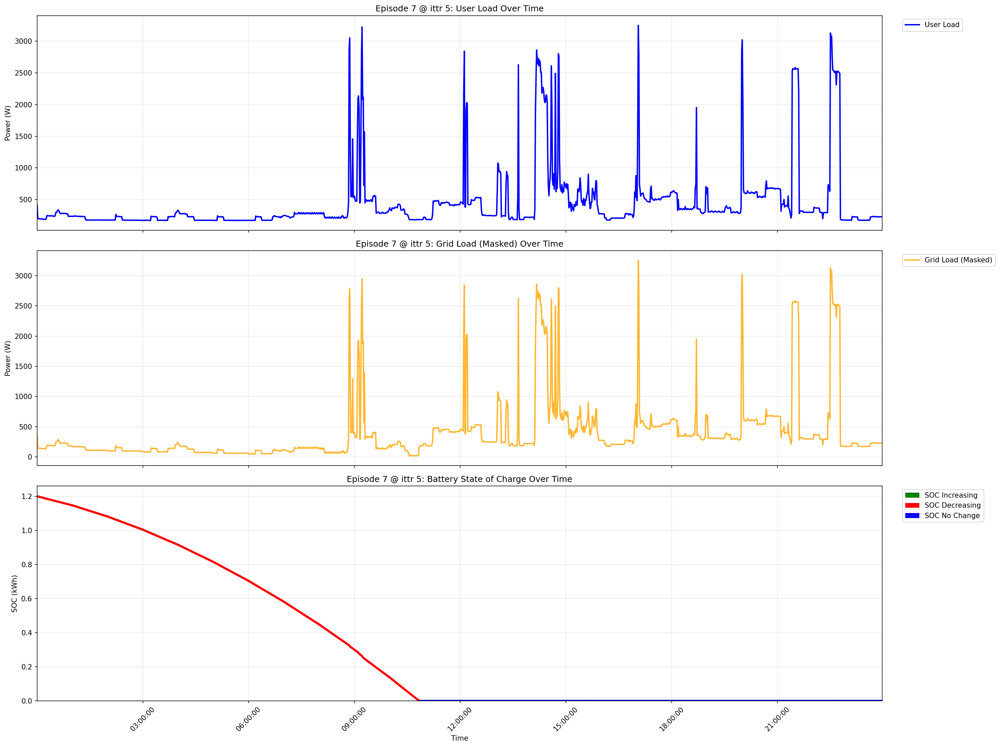

[2025-07-25 00:44:44:121] Plotting quick episode 55 @ ittr 5 details...


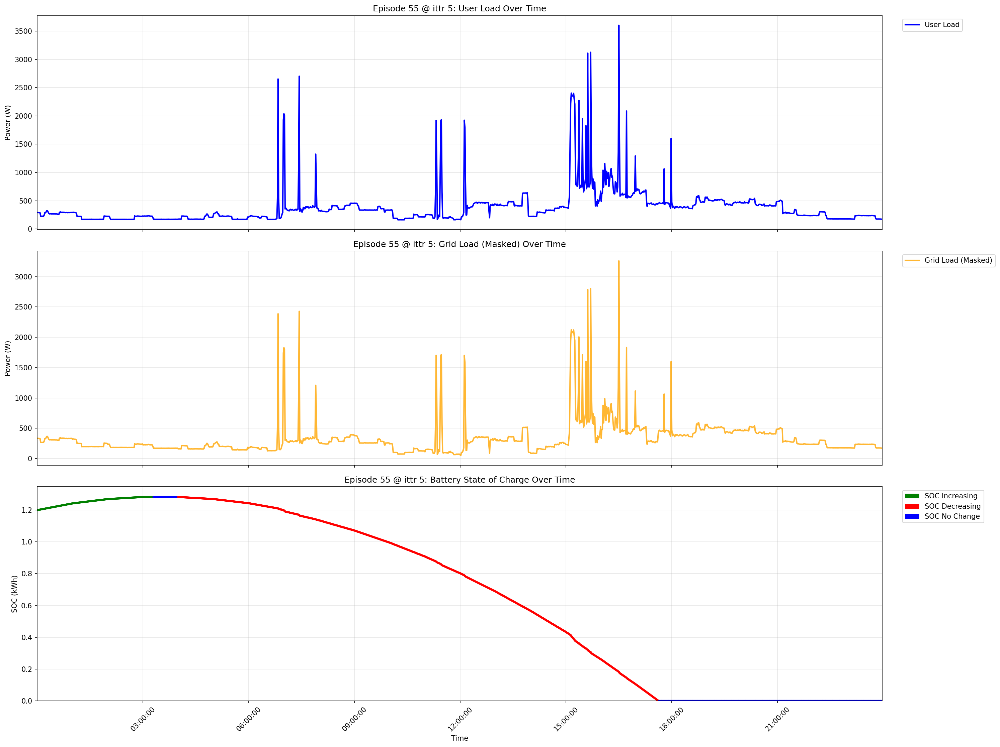

[2025-07-25 00:44:45:337] Plotting quick episode 68 @ ittr 5 details...


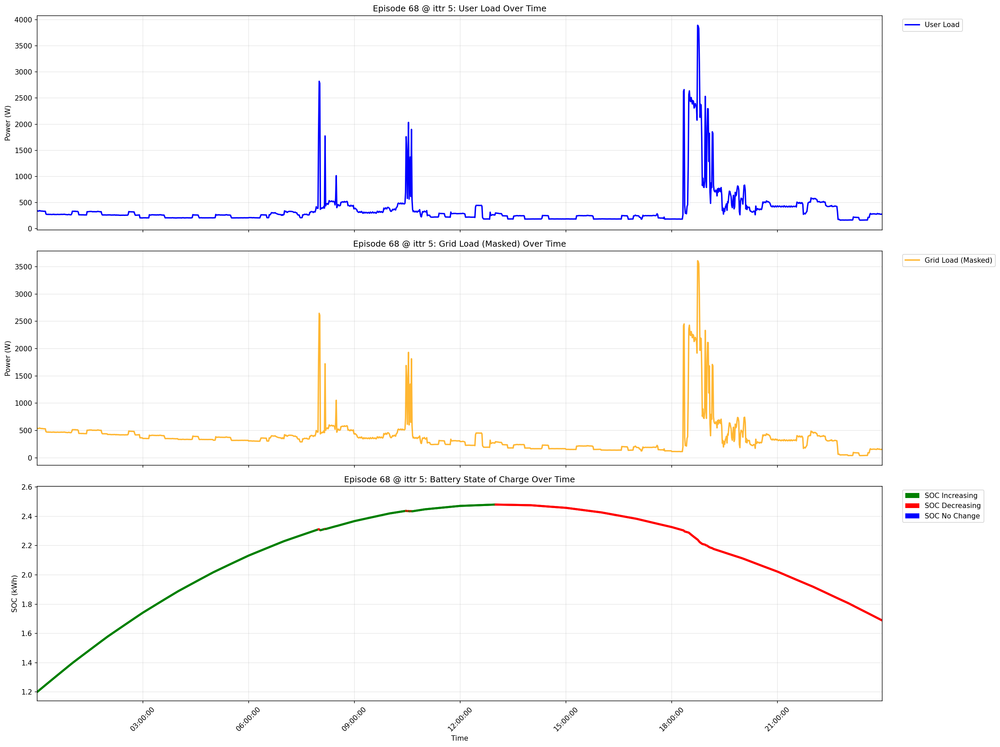

[2025-07-25 00:44:46:604] Plotting quick episode 61 @ ittr 5 details...


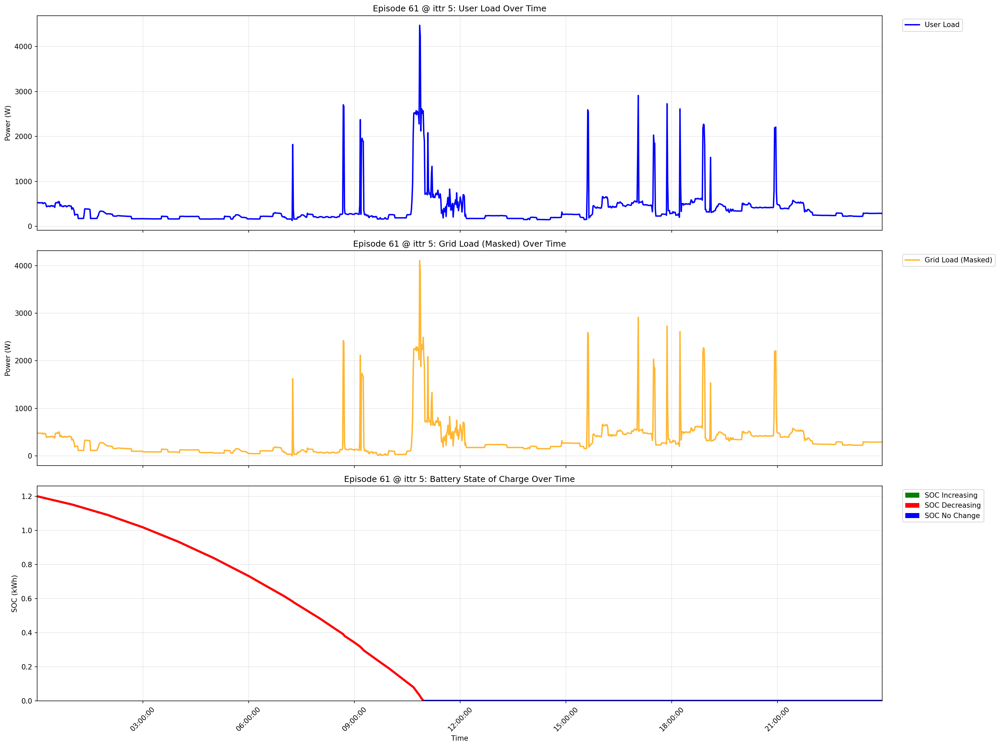

[2025-07-25 00:44:47:786] Plotting quick episode 24 @ ittr 5 details...


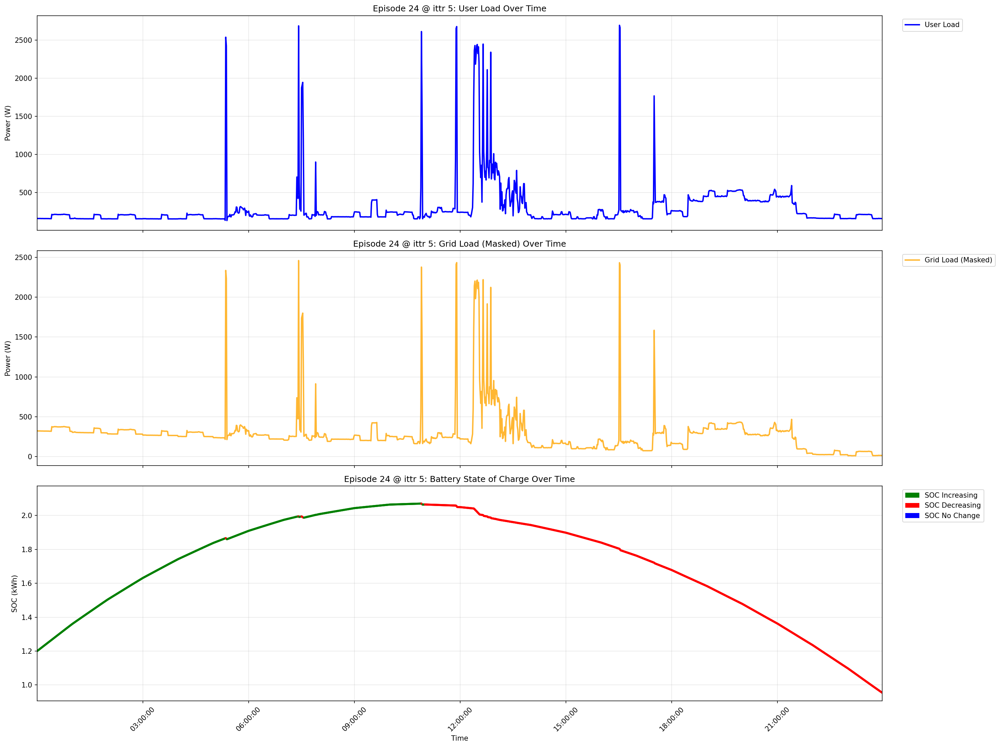

[2025-07-25 00:44:49:003] Plotting quick episode 56 @ ittr 5 details...


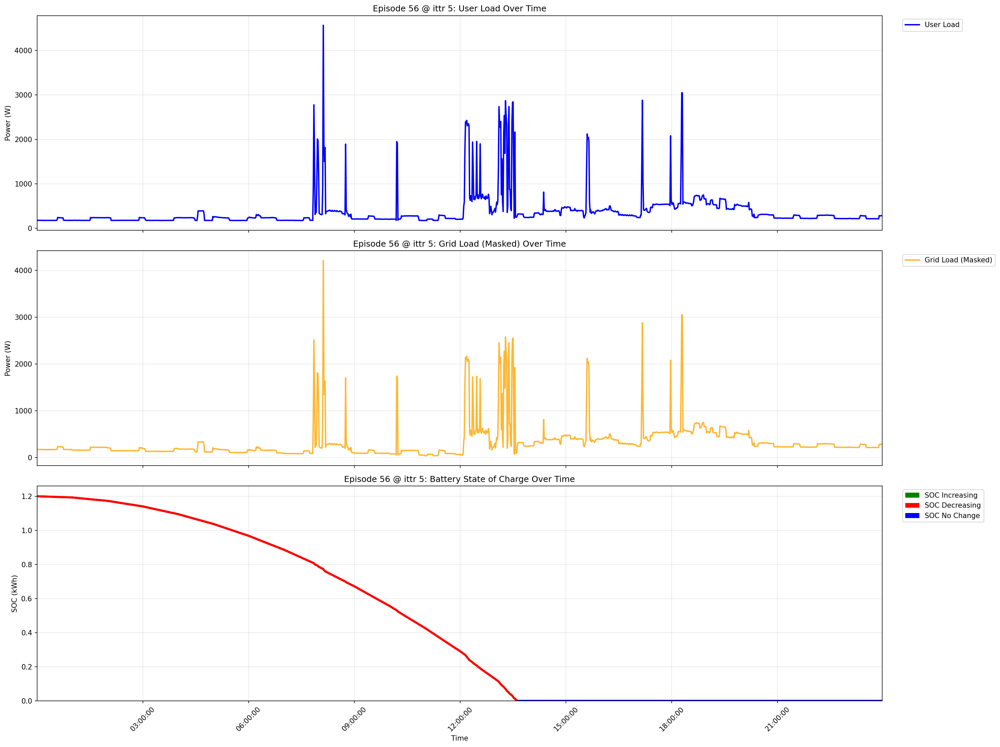

[2025-07-25 00:44:50:202] Plotting quick episode 9 @ ittr 5 details...


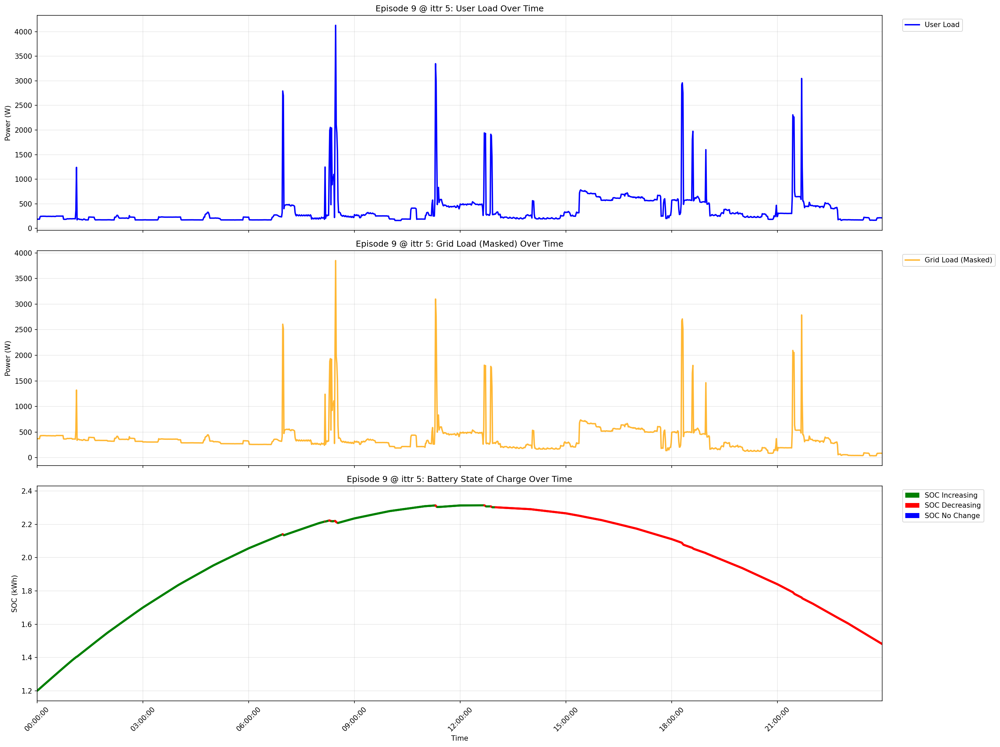

[2025-07-25 00:44:51:444] Plotting quick episode 15 @ ittr 5 details...


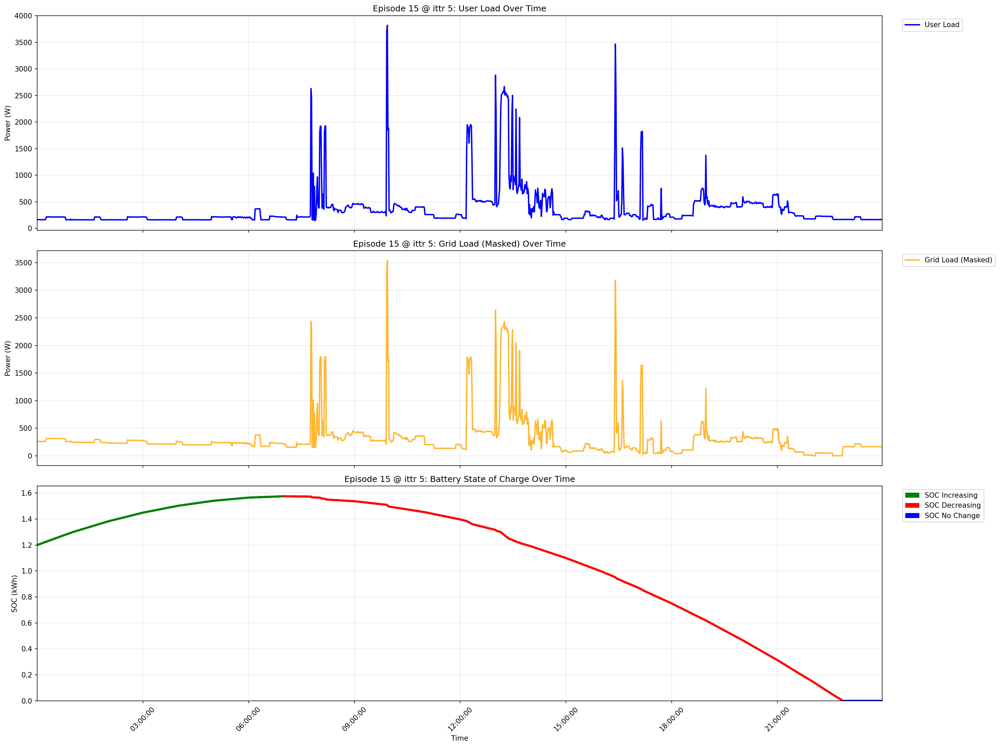

[2025-07-25 00:44:52:694] Plotting quick episode 21 @ ittr 5 details...


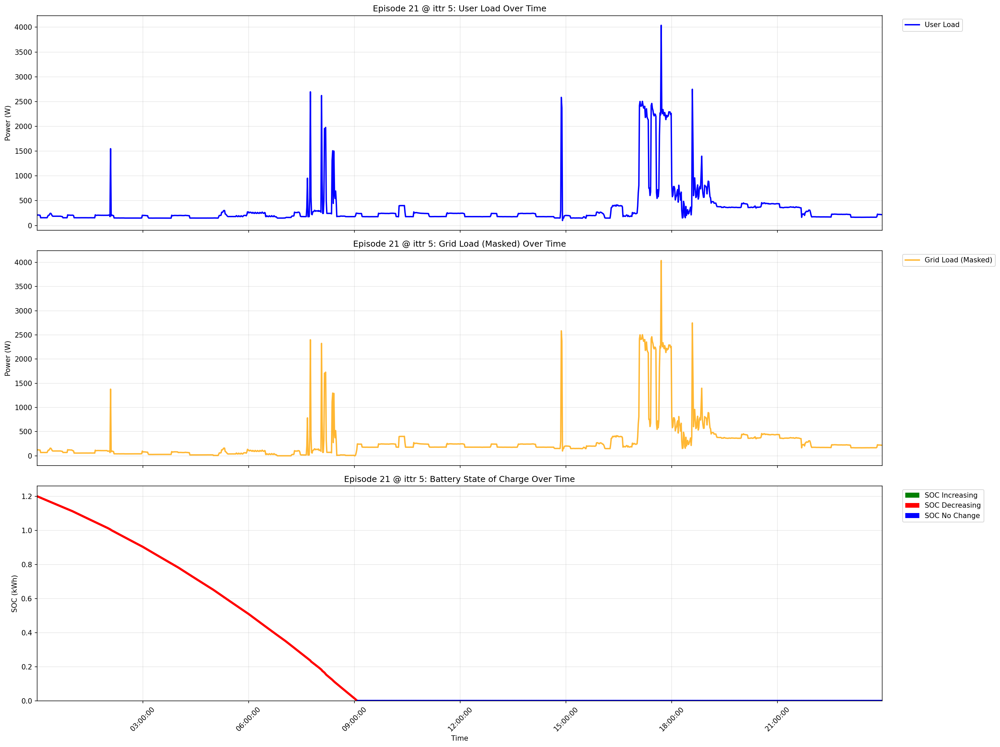

[2025-07-25 00:44:54:391] Plotting quick episode 41 @ ittr 5 details...


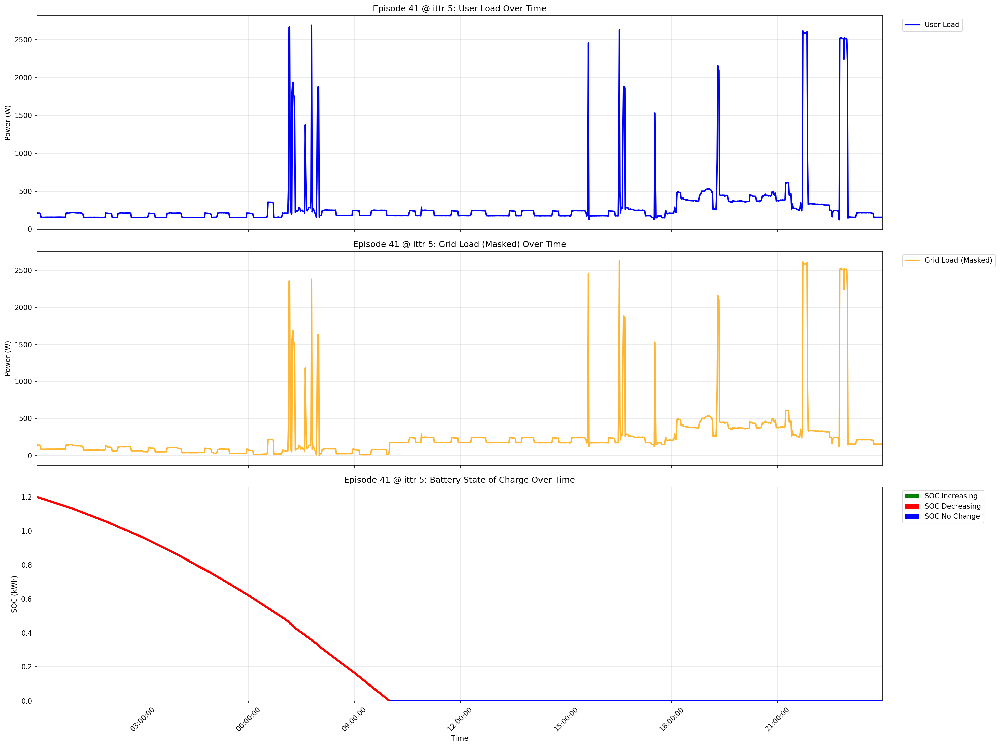

In [ ]:
# plot for every validation/testing episodes

for phrase, episode_jsons_list in episode_jsons.items():
    print_log(f"Plotting episodes for phrase '{phrase}'...")

    # Plot all episodes
    # unlike in training, we save episodes with filename based on the episode_index
    for i, episode_json in enumerate(episode_jsons_list):
        episode_ittr = episode_json['episode']
        episode_info_df_list = episode_info_dfs[phrase][i]

        for episode_df in episode_info_df_list:
            episode_ittr = episode_json['episode']
            episode_idx = episode_df['episode_index'].iloc[0]  # Get the actual episode index

            print_log(f"Plotting {phrase} episode {episode_idx} @ ittr {episode_ittr} details...")

            # Create save path for individual episode plots
            save_path = expt_folder / "graphs" / "per_episode" / f"episode_{i+1:0>4d}_three_subplots.png"
            if not save_path.parent.exists():
                save_path.parent.mkdir(parents=True)

            fig = plot_episode_details_three_subplots(episode_df, episode_idx, episode_ittr, save_path=save_path, use_datetime=True, show=True)

            # Close the figure to free memory
            plt.close(fig)

Another way to perform that is we create a dictionary with key = episode_index

Then we put the episode_idx to each value of the dictionary

In [ ]:
episode_jsons['quick']

In [11]:
# create grouped_episode_idx from episode_jsons
grouped_episode_idx = {}
for phrase, phrase_episode_jsons_list in episode_jsons.items():
    for i, episode_json in enumerate(phrase_episode_jsons_list):
        episode_idx = episode_json['episode']

        for j, episode_num in enumerate(episode_json["episode_indices"]):

            if episode_num not in grouped_episode_idx:
                grouped_episode_idx[episode_num] = []

            grouped_episode_idx[episode_num].append((phrase, episode_idx, i, j))  # Store the phrase, episode_idx (to which run the validation), i (the index at the episode_dfs_list of that episode), j (the index in the episode_json)

    
for episode_num, episode_idx_tuples in grouped_episode_idx.items():
    grouped_episode_idx[episode_num] = sorted(episode_idx_tuples, key=lambda x: x[1])  # Sort by episode_idx (the run index)

grouped_episode_idx


{7: [('quick', 5, 0, 0),
  ('quick', 10, 1, 5),
  ('quick', 15, 2, 8),
  ('quick', 25, 4, 1),
  ('quick', 35, 6, 2),
  ('critical', 50, 0, 7),
  ('quick', 55, 9, 7),
  ('quick', 95, 17, 3),
  ('critical', 100, 1, 7),
  ('critical', 150, 2, 7),
  ('quick', 170, 30, 2),
  ('critical', 200, 3, 7),
  ('quick', 205, 36, 8),
  ('critical', 250, 4, 7),
  ('critical', 300, 5, 7),
  ('quick', 330, 59, 5),
  ('critical', 350, 6, 7),
  ('quick', 355, 63, 1),
  ('critical', 400, 7, 7),
  ('quick', 415, 74, 4),
  ('critical', 450, 8, 7),
  ('quick', 475, 85, 0),
  ('critical', 500, 9, 7),
  ('quick', 510, 91, 6),
  ('quick', 545, 98, 4),
  ('critical', 550, 10, 7),
  ('quick', 585, 105, 1),
  ('critical', 600, 11, 7)],
 55: [('quick', 5, 0, 1),
  ('quick', 15, 2, 1),
  ('quick', 30, 5, 6),
  ('critical', 50, 0, 55),
  ('quick', 80, 14, 1),
  ('critical', 100, 1, 55),
  ('quick', 110, 19, 4),
  ('quick', 115, 20, 5),
  ('quick', 140, 25, 4),
  ('critical', 150, 2, 55),
  ('quick', 155, 27, 6),
  ('q

---

In [12]:
# Create a summary grid plot showing multiple episodes
def plot_episodes_grid(episode_dfs_list, episode_indices=None, save_path=None, show=True):
    """
    Create a grid plot showing multiple episodes in subplots
    
    Args:
        episode_dfs_list: List of episode DataFrames
        episode_indices: List of episode indices to plot (e.g., [0, 5, 10, 15]). 
                        If None, plots first 9 episodes.
        save_path: Optional path to save the figure
    """
    # Determine which episodes to plot
    if episode_indices is None:
        n_episodes = min(len(episode_dfs_list), 9)
        episodes_to_plot = list(range(n_episodes))
    else:
        episodes_to_plot = [idx for idx in episode_indices if idx < len(episode_dfs_list)]
        n_episodes = len(episodes_to_plot)
    
    if n_episodes == 0:
        print("No valid episodes to plot.")
        return None
    
    # Compute optimal grid layout
    def compute_optimal_layout(n):
        """Compute optimal number of rows and columns for n subplots"""
        if n <= 0:
            return 1, 1
        elif n == 1:
            return 1, 1
        elif n == 2:
            return 1, 2
        elif n == 3:
            return 1, 3
        elif n == 4:
            return 2, 2
        elif n <= 6:
            return 2, 3
        elif n <= 8:
            return 2, 4
        elif n <= 10:
            return 2, 5
        else:
            # For larger numbers, try to keep aspect ratio reasonable
            cols = int(np.ceil(np.sqrt(n)))
            rows = int(np.ceil(n / cols))
            return rows, cols
    
    n_rows, n_cols = compute_optimal_layout(n_episodes)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 6*n_rows), dpi=150)
    
    # Handle single subplot case
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    for i in range(n_episodes):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col] if n_rows > 1 or n_cols > 1 else axes[0, 0]
        
        # Get the episode index and corresponding dataframe
        episode_idx_in_list = episodes_to_plot[i]
        episode_df = episode_dfs_list[episode_idx_in_list]
        episode_idx = episode_df['episode_index'].iloc[0]
        # episode_ittr = episode_df['episode'].iloc[0]
        episode_ittr = episode_df['episode_valid'].iloc[0]
        time_steps = range(len(episode_df))
        
        # Plot user load and grid load
        ax.plot(time_steps, episode_df['user_load (W)'], label='User Load', color='blue', alpha=0.7)
        ax.plot(time_steps, episode_df['grid_load (W)'], label='Grid Load', color='pink', alpha=0.7)
        
        # Plot SOC on secondary y-axis with LineCollection
        ax2 = ax.twinx()
        soc_values = episode_df['battery_soc (kWh)'].values
        soc_changes = np.diff(soc_values)
        
        # Create numerical color array based on SOC changes
        color_values = []
        for change in soc_changes:
            if change > 1e-6:
                color_values.append(1)    # SOC increases (green)
            elif change < -1e-6:
                color_values.append(-1)   # SOC decreases (red)  
            else:
                color_values.append(0)    # No change (blue)
        
        # Create line segments for LineCollection
        from matplotlib.collections import LineCollection
        points = np.array([time_steps, soc_values]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        
        # Create LineCollection with custom colormap
        lc = LineCollection(segments, linewidth=2, capstyle='round')
        lc.set_array(np.array(color_values))
        
        # Create custom colormap: red (-1) -> blue (0) -> green (1)
        from matplotlib.colors import ListedColormap
        colors_map = ['red', 'blue', 'green']
        cmap = ListedColormap(colors_map, name='soc_change', N=3)
        
        lc.set_cmap(cmap)
        lc.set_clim(-1, 1)
        
        # Add the line collection to the plot
        line = ax2.add_collection(lc)

        ax.set_title(f'Episode {episode_idx} @ ittr {episode_ittr}', fontsize=10)
        ax.set_xlabel('Time Steps', fontsize=8)
        ax.set_ylabel('Power (W)', fontsize=8)
        ax2.set_ylabel('SOC (%)', fontsize=8)
        
        # Set axis limits for better visualization
        ax2.set_xlim(0, len(time_steps)-1)
        ax2.set_ylim(soc_values.min() * 0.95, soc_values.max() * 1.05)
        
        if i == 0:  # Add legend only to first subplot
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
            # Add SOC legend
            legend_elements = [Patch(facecolor='green', label='SOC ↑'),
                             Patch(facecolor='red', label='SOC ↓'),
                             Patch(facecolor='blue', label='SOC →')]
            ax2.legend(handles=legend_elements, bbox_to_anchor=(1.05, 0.8), loc='upper left', fontsize=8)
        
        ax.grid(True, alpha=0.3)
    
    # Hide empty subplots
    for i in range(n_episodes, n_rows * n_cols):
        row = i // n_cols
        col = i % n_cols
        if n_rows > 1 or n_cols > 1:
            ax = axes[row, col]
        else:
            continue  # No empty plots for single subplot
        ax.set_visible(False)
    
    plt.tight_layout()
    
    if save_path:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
    
    if show:
        plt.show()
    return fig

# Create grid summary plot
# print_log("Creating episodes grid summary plot...")

# Example 1: Plot first 9 episodes (default behavior)
# fig_grid = plot_episodes_grid(episode_info_dfs, save_path=grid_save_path)

# Example 2: Plot specific episodes with step=5 (episodes 100, 105, 110, 115, ...)
# episode_indices = [i for i in range(0, min(50, len(episode_info_dfs)), 5)]  # [0, 5, 10, 15, ..., 45]
# print_log(f"Plotting episodes: {episode_indices}")

# grid_save_path = expt_folder / "graphs" / f"episodes_grid_summary_[{episode_indices[0]}_{episode_indices[-1]}].png"
# fig_grid = plot_episodes_grid(episode_info_dfs, episode_indices=episode_indices, save_path=None)
# plt.close('all')

In [ ]:
# Create multiple grid summary plots for different episode ranges
# Each plot will show 10 episodes with step=5

total_episodes = len(episode_info_dfs)
episodes_per_plot = 10  # Number of episodes per grid plot
step_size = 5           # Step between episodes

# Calculate how many plots we need based on episodes_per_plot * step_size chunks
chunk_size = episodes_per_plot * step_size  # 50 episodes per chunk

print_log(f"Total episodes available: {total_episodes}")
print_log(f"Creating grid plots for every {episodes_per_plot} episodes (step={step_size})")

for start_idx in range(0, total_episodes, chunk_size):
    # Create episode indices for this chunk: [start_idx, start_idx+5, start_idx+10, ..., start_idx+45]
    episode_indices = [i for i in range(start_idx, min(start_idx + chunk_size, total_episodes), step_size)]
    
    # Only create plot if we have at least a few episodes
    if len(episode_indices) >= 2:
        print_log(f"Creating grid plot for episodes: {episode_indices}")
        
        # Create filename with episode range
        grid_save_path = expt_folder / "graphs" / f"episodes_grid_summary_[{episode_indices[0]:04d}_{episode_indices[-1]:04d}].png"

        # Create and save the plot
        fig_grid = plot_episodes_grid(episode_info_dfs, episode_indices=episode_indices, save_path=grid_save_path, show=False)

        # Close figure to free memory
        if fig_grid:
            plt.close('all')
    else:
        print_log(f"Skipping range starting at {start_idx} - not enough episodes remaining")

print_log("Completed creating all grid summary plots.")

In [16]:
episode_info_dfs

{'quick': [[      episode_index  current_step            datetime  battery_soc (%)  \
   0                 7             0 2013-03-16 00:00:08         0.150000   
   1                 7             1 2013-03-16 00:01:08         0.149889   
   2                 7             2 2013-03-16 00:02:08         0.149776   
   3                 7             3 2013-03-16 00:03:08         0.149664   
   4                 7             4 2013-03-16 00:04:08         0.149551   
   ...             ...           ...                 ...              ...   
   1434              7          1434 2013-03-16 23:54:08         0.000000   
   1435              7          1435 2013-03-16 23:55:08         0.000000   
   1436              7          1436 2013-03-16 23:56:08         0.000000   
   1437              7          1437 2013-03-16 23:57:08         0.000000   
   1438              7          1438 2013-03-16 23:58:08         0.000000   
   
         battery_soc (kWh)  user_load (W)  grid_load (W)  actio

In [14]:
# another example: plot the same episode with different episode indices
# This is useful to compare the same episode with different indices

for k in grouped_episode_idx.keys():
    if len(grouped_episode_idx[k]) >= 1:
        print_log(f"Plotting episode {k:04d} with indices: {grouped_episode_idx[k]}")

        # Create a save path for the grid plot
        grid_save_path = expt_folder / "graphs" / "grouped_by_episode_idx" / f"episode_idx_{k:04d}_grid_summary.png"

        if not grid_save_path.parent.exists():
            grid_save_path.parent.mkdir(parents=True)

        episode_dfs_list = [episode_info_dfs[phrase][i][j] for phrase, episode_idx, i, j in grouped_episode_idx[k]]
        episode_indices = list(range(len(episode_dfs_list)))

        fig_grid = plot_episodes_grid(episode_dfs_list, episode_indices=episode_indices, save_path=grid_save_path, show=False)
        # plt.close('all')

[2025-07-25 00:51:23:998] Plotting episode 0007 with indices: [('quick', 5, 0, 0), ('quick', 10, 1, 5), ('quick', 15, 2, 8), ('quick', 25, 4, 1), ('quick', 35, 6, 2), ('critical', 50, 0, 7), ('quick', 55, 9, 7), ('quick', 95, 17, 3), ('critical', 100, 1, 7), ('critical', 150, 2, 7), ('quick', 170, 30, 2), ('critical', 200, 3, 7), ('quick', 205, 36, 8), ('critical', 250, 4, 7), ('critical', 300, 5, 7), ('quick', 330, 59, 5), ('critical', 350, 6, 7), ('quick', 355, 63, 1), ('critical', 400, 7, 7), ('quick', 415, 74, 4), ('critical', 450, 8, 7), ('quick', 475, 85, 0), ('critical', 500, 9, 7), ('quick', 510, 91, 6), ('quick', 545, 98, 4), ('critical', 550, 10, 7), ('quick', 585, 105, 1), ('critical', 600, 11, 7)]
[2025-07-25 00:51:30:195] Plotting episode 0055 with indices: [('quick', 5, 0, 1), ('quick', 15, 2, 1), ('quick', 30, 5, 6), ('critical', 50, 0, 55), ('quick', 80, 14, 1), ('critical', 100, 1, 55), ('quick', 110, 19, 4), ('quick', 115, 20, 5), ('quick', 140, 25, 4), ('critical', 1

/tmp/ipykernel_814332/299486953.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 6*n_rows), dpi=150)


[2025-07-25 00:53:23:898] Plotting episode 0039 with indices: [('quick', 15, 2, 7), ('critical', 50, 0, 39), ('critical', 100, 1, 39), ('quick', 125, 22, 5), ('critical', 150, 2, 39), ('quick', 185, 33, 9), ('critical', 200, 3, 39), ('quick', 225, 40, 4), ('critical', 250, 4, 39), ('quick', 260, 46, 1), ('critical', 300, 5, 39), ('critical', 350, 6, 39), ('critical', 400, 7, 39), ('critical', 450, 8, 39), ('critical', 500, 9, 39), ('quick', 505, 90, 7), ('quick', 515, 92, 2), ('quick', 530, 95, 1), ('critical', 550, 10, 39), ('quick', 590, 106, 4), ('critical', 600, 11, 39)]
[2025-07-25 00:53:28:530] Plotting episode 0002 with indices: [('quick', 15, 2, 9), ('quick', 35, 6, 5), ('quick', 45, 8, 4), ('critical', 50, 0, 2), ('quick', 85, 15, 5), ('quick', 95, 17, 5), ('critical', 100, 1, 2), ('critical', 150, 2, 2), ('quick', 195, 35, 9), ('critical', 200, 3, 2), ('quick', 205, 36, 5), ('critical', 250, 4, 2), ('quick', 270, 48, 4), ('critical', 300, 5, 2), ('quick', 335, 60, 6), ('quick

In [29]:
episode_dfs_list[0]

,episode_index,current_step,datetime,battery_soc (%),battery_soc (kWh),user_load (W),grid_load (W),action (kW),battery_action (kW),reward,f_signal,g_signal,f_signal-predicted_mean,f_signal-predicted_log_var,f_signal-target,episode_valid
0,7,0,2013-03-16 00:00:08,0.150000,1.200000,414.000000,360.768299,-0.053232,-0.053232,0.047157,-0.094403,0.000090,NaN,NaN,NaN,5
1,7,1,2013-03-16 00:01:08,0.149889,1.199113,197.988405,143.841762,-0.054147,-0.054147,0.045393,-0.090876,0.000091,-0.013986,0.0,-0.471889,5
2,7,2,2013-03-16 00:02:08,0.149776,1.198210,201.941786,147.833136,-0.054109,-0.054109,0.045405,-0.090901,0.000091,-0.015998,0.0,-0.464288,5
3,7,3,2013-03-16 00:03:08,0.149664,1.197309,200.838414,146.746223,-0.054092,-0.054092,0.046265,-0.092621,0.000091,-0.018050,0.0,-0.466410,5
4,7,4,2013-03-16 00:04:08,0.149551,1.196407,197.564303,143.479362,-0.054085,-0.054085,0.046024,-0.092138,0.000091,-0.019643,0.0,-0.472704,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1434,7,1434,2013-03-16 23:54:08,0.000000,0.000000,229.682945,229.682945,-0.335412,-0.000000,0.039936,-0.079872,0.000000,0.005702,0.0,-0.410957,5
1435,7,1435,2013-03-16 23:55:08,0.000000,0.000000,229.271134,229.271134,-0.335402,-0.000000,0.040115,-0.080230,0.000000,0.005730,0.0,-0.411748,5
1436,7,1436,2013-03-16 23:56:08,0.000000,0.000000,228.744490,228.744490,-0.335389,-0.000000,0.039609,-0.079218,0.000000,0.005742,0.0,-0.412761,5
1437,7,1437,2013-03-16 23:57:08,0.000000,0.000000,230.247722,230.247722,-0.335426,-0.000000,0.039941,-0.079881,0.000000,0.005732,0.0,-0.409871,5
